In [1]:
import os.path

import pandas as pd
import numpy as np
from sklearn import preprocessing
from generate_samples import generate_samples

In [2]:
train_dataset = pd.read_csv('../../data/processed/trainData.csv')
test_dataset = pd.read_csv('../../data/processed/testData.csv')

In [3]:
def preprocess_data(dataset):
    print(dataset)
    dataset = dataset.drop(['workclass','fnlwgt','education','marital-status','occupation','relationship','native-country'],axis=1)
    print(dataset.head)
    dataset['sex'] = np.where(dataset['sex'] == ' Male', 1, 0)
    dataset['race'] = np.where(dataset['race'] != ' White', 0, 1)
    dataset['Probability'] = np.where(dataset['Probability'] == ' <=50K', 0, 1)
    dataset['age'] = np.where(dataset['age'] >= 70, 70, dataset['age'])
    dataset['age'] = np.where((dataset['age'] >= 60 ) & (dataset['age'] < 70), 60, dataset['age'])
    dataset['age'] = np.where((dataset['age'] >= 50 ) & (dataset['age'] < 60), 50, dataset['age'])
    dataset['age'] = np.where((dataset['age'] >= 40 ) & (dataset['age'] < 50), 40, dataset['age'])
    dataset['age'] = np.where((dataset['age'] >= 30 ) & (dataset['age'] < 40), 30, dataset['age'])
    dataset['age'] = np.where((dataset['age'] >= 20 ) & (dataset['age'] < 30), 20, dataset['age'])
    dataset['age'] = np.where((dataset['age'] >= 10 ) & (dataset['age'] < 10), 10, dataset['age'])
    dataset['age'] = np.where(dataset['age'] < 10, 0, dataset['age'])

    return dataset

In [4]:
train_dataset = preprocess_data(train_dataset)
print(train_dataset)
test_dataset = preprocess_data(test_dataset)
print(test_dataset)

       age          workclass  fnlwgt      education  education-num  \
0       52            Private  187938   Some-college             10   
1       43            Private  169628      Bachelors             13   
2       43   Self-emp-not-inc   89636      Bachelors             13   
3       32            Private  123291           12th              8   
4       32            Private   51150           12th              8   
...    ...                ...     ...            ...            ...   
36173   26            Private  177635           12th              8   
36174   21            Private  293968   Some-college             10   
36175   51          Local-gov  201040        Masters             14   
36176   53            Private  226135            9th              5   
36177   23            Private  315065           10th              6   

               marital-status          occupation    relationship  \
0                    Divorced               Sales   Not-in-family   
1        

In [5]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(train_dataset)
train_dataset = pd.DataFrame(scaler.transform(train_dataset), columns = train_dataset.columns)
test_dataset = pd.DataFrame(scaler.transform(test_dataset), columns = train_dataset.columns)

## using FairSmote to generate datapoints in order to minimize bias

In [6]:
protected_attributes = ('sex', 'race')

negative_female_nonWhite = (len(train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 0)]))
negative_female_white = (len(train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 1)]))
negative_male_nonWhite = (len(train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 0)]))
negative_male_white = (len(train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 1)]))
positive_female_nonWhite = (len(train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 0)]))
positive_female_white = (len(train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 1)]))
positive_male_nonWhite = (len(train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 0)]))
positive_male_white = (len(train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 1)]))

maximum = max(negative_female_nonWhite, negative_female_white, negative_male_nonWhite, negative_male_white, positive_female_nonWhite, positive_female_white, positive_male_nonWhite, positive_male_white)

minimum = min(negative_female_nonWhite, negative_female_white, negative_male_nonWhite, negative_male_white, positive_female_nonWhite, positive_female_white, positive_male_nonWhite, positive_male_white)

#to retrieve value from counts follow this format : counts[outcome => 1 is positive 0 is negative][sex => 0 is female and 1 is male][race => 0 is non-white and 1 is white]
counts = [[[negative_female_nonWhite, negative_female_white], [negative_male_nonWhite, negative_male_white]], [[positive_female_nonWhite, positive_female_white], [positive_male_nonWhite, positive_male_white]]]

countarr = [counts[0][0][0], counts[0][0][1], counts[0][1][0], counts[0][1][1], counts[1][0][0], counts[1][0][1], counts[1][1][0], counts[1][1][1]]

countlabels = ['N-F-NW', 'N-F-W', 'N-M-NW', 'N-M-W', 'P-F-NW', 'P-F-W', 'P-M-NW', 'P-M-W']

for i in range(8):
    if countarr[i] is maximum:
        print(f"{countlabels[i]} is the maximum")

N-M-W is the maximum


In [7]:
increase_amount = []
for i in range(8):
    increase_amount.append(maximum - countarr[i])

print("for each class n amount of new datapoints will be created:")
for i in range(8):
    print("{} will be increase by {}".format(countlabels[i], increase_amount[i]))

for each class n amount of new datapoints will be created:
N-F-NW will be increase by 12552
N-F-W will be increase by 6300
N-M-NW will be increase by 12411
N-M-W will be increase by 0
P-F-NW will be increase by 14440
P-F-W will be increase by 13424
P-M-NW will be increase by 13978
P-M-W will be increase by 7581


In [8]:
df_negative_female_nonWhite = train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 0)]
df_negative_female_white = train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 1)]
df_negative_male_nonWhite = train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 0)]
df_negative_male_white = train_dataset[(train_dataset['Probability'] == 0) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 1)]
df_positive_female_nonWhite = train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 0)]
df_positive_female_white = train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 0) & (train_dataset[protected_attributes[1]] == 1)]
df_positive_male_nonWhite = train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 0)]
df_positive_male_white = train_dataset[(train_dataset['Probability'] == 1) & (train_dataset[protected_attributes[0]] == 1) & (train_dataset[protected_attributes[1]] == 1)]

dataframe_collection = [df_negative_female_nonWhite, df_negative_female_white, df_negative_male_nonWhite, df_negative_male_white, df_positive_female_nonWhite, df_positive_female_white, df_positive_male_nonWhite, df_positive_male_white]

for dataframe in dataframe_collection:
    dataframe['race'] = dataframe['race'].astype(str)
    dataframe['sex'] = dataframe['sex'].astype(str)

new_dataframe_collection = []
for i, dataframe in enumerate(dataframe_collection, start=0):
    new_dataframe_collection.append(generate_samples(increase_amount[i], dataframe, 'Adult'))

/tmp/ipykernel_21893/2739149037.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['race'] = dataframe['race'].astype(str)
/tmp/ipykernel_21893/2739149037.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['sex'] = dataframe['sex'].astype(str)
/home/rohamkoohestani/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/home/rohamkoohestani/anaconda3/lib/python3.9

In [9]:
df = pd.concat(new_dataframe_collection)
df

,age,education-num,race,sex,capital-gain,capital-loss,hours-per-week,Probability
0,0.433962,0.800000,0.0,0.0,0.000000,0.0,0.602041,0.0
1,0.622642,0.400000,0.0,0.0,0.000000,0.0,0.397959,0.0
2,0.433962,0.600000,0.0,0.0,0.000000,0.0,0.397959,0.0
3,0.245283,0.533333,0.0,0.0,0.000000,0.0,0.397959,0.0
4,0.245283,0.800000,0.0,0.0,0.000000,0.0,0.500000,0.0
...,...,...,...,...,...,...,...,...
14603,0.622642,0.600000,1.0,1.0,0.000000,0.0,0.397959,1.0
14604,0.245283,0.666667,1.0,1.0,0.000000,0.0,0.551020,1.0
14605,0.622642,0.533333,1.0,1.0,0.076881,0.0,0.500000,1.0
14606,0.433962,0.800000,1.0,1.0,0.000000,0.0,0.755102,1.0


In [27]:
# this is just to check what would happen if datasets were of same size

complete_dataset = df

df_negative_female_nonWhite = complete_dataset[(complete_dataset['Probability'] == 0) & (complete_dataset[protected_attributes[0]] == 0) & (complete_dataset[protected_attributes[1]] == 0)]
df_negative_female_white = complete_dataset[(complete_dataset['Probability'] == 0) & (complete_dataset[protected_attributes[0]] == 0) & (complete_dataset[protected_attributes[1]] == 1)]
df_negative_male_nonWhite = complete_dataset[(complete_dataset['Probability'] == 0) & (complete_dataset[protected_attributes[0]] == 1) & (complete_dataset[protected_attributes[1]] == 0)]
df_negative_male_white = complete_dataset[(complete_dataset['Probability'] == 0) & (complete_dataset[protected_attributes[0]] == 1) & (complete_dataset[protected_attributes[1]] == 1)]
df_positive_female_nonWhite = complete_dataset[(complete_dataset['Probability'] == 1) & (complete_dataset[protected_attributes[0]] == 0) & (complete_dataset[protected_attributes[1]] == 0)]
df_positive_female_white = complete_dataset[(complete_dataset['Probability'] == 1) & (complete_dataset[protected_attributes[0]] == 0) & (complete_dataset[protected_attributes[1]] == 1)]
df_positive_male_nonWhite = complete_dataset[(complete_dataset['Probability'] == 1) & (complete_dataset[protected_attributes[0]] == 1) & (complete_dataset[protected_attributes[1]] == 0)]
df_positive_male_white = complete_dataset[(complete_dataset['Probability'] == 1) & (complete_dataset[protected_attributes[0]] == 1) & (complete_dataset[protected_attributes[1]] == 1)]

dataframe_collection = [df_negative_female_nonWhite, df_negative_female_white, df_negative_male_nonWhite, df_negative_male_white, df_positive_female_nonWhite, df_positive_female_white, df_positive_male_nonWhite, df_positive_male_white]

new_dataframe_collection = []

for dataframe in dataframe_collection:
    new_dataframe_collection.append(dataframe.sample(n=6552))

df = pd.concat(new_dataframe_collection)
df

ValueError: a must be greater than 0 unless no samples are taken

In [10]:
x_train, y_train = df.loc[:, df.columns != 'Probability'], df['Probability']
x_test, y_test = test_dataset.loc[:, test_dataset.columns != 'Probability'], test_dataset['Probability']

In [11]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=100)
classifier.fit(x_train, y_train)

y_pred = classifier.predict(x_test)

In [12]:
from sklearn.metrics import accuracy_score

print("Accuracy score: {}".format(accuracy_score(y_test, y_pred)))

Accuracy score: 0.7757629367536488


In [13]:
from sklearn.linear_model import LogisticRegression

logistic_classifier = LogisticRegression(C=1.0, penalty='l2', solver='liblinear', max_iter=100)
logistic_classifier.fit(x_train, y_train)

y_pred_logistic = logistic_classifier.predict(x_test)

print("Accuracy score: {}".format(accuracy_score(y_test, y_pred_logistic)))


Accuracy score: 0.7494471472799646


In [14]:
from sklearn.svm import SVC

svm = SVC()
svm.fit(x_train, y_train)
y_pred_svm = svm.predict(x_test)
print("Accuracy score: {}".format(accuracy_score(y_test, y_pred_svm)))

Accuracy score: 0.7736620964175144


In [15]:
from sklearn.metrics import confusion_matrix



print(confusion_matrix(y_test, y_pred))
print(confusion_matrix(y_test, y_pred_logistic))
print(confusion_matrix(y_test, y_pred_svm))

[[5462 1383]
 [ 645 1554]]
[[5208 1637]
 [ 629 1570]]
[[5433 1412]
 [ 635 1564]]


In [33]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred, target_names=['<=50k', '>50k']))
print(classification_report(y_test, y_pred_logistic, target_names=['<=50k', '>50k']))

              precision    recall  f1-score   support

       <=50k       0.90      0.80      0.84      6845
        >50k       0.53      0.71      0.61      2199

    accuracy                           0.78      9044
   macro avg       0.71      0.75      0.73      9044
weighted avg       0.81      0.78      0.79      9044

              precision    recall  f1-score   support

       <=50k       0.89      0.76      0.82      6845
        >50k       0.49      0.71      0.58      2199

    accuracy                           0.75      9044
   macro avg       0.69      0.74      0.70      9044
weighted avg       0.79      0.75      0.76      9044



/home/rohamkoohestani/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/home/rohamkoohestani/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
/home/rohamkoohestani/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plo

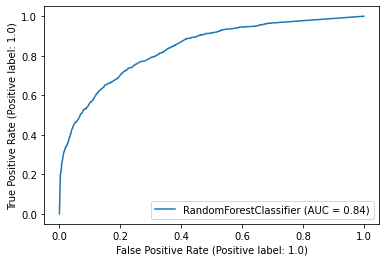

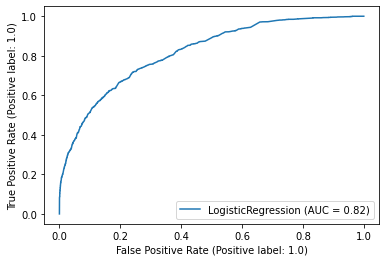

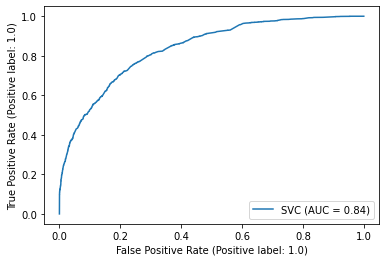

In [16]:
from sklearn.metrics import plot_roc_curve

plot_roc_curve(classifier, x_test, y_test)
plot_roc_curve(logistic_classifier, x_test, y_test)
plot_roc_curve(svm, x_test, y_test)


In [ ]:
from Metrics import *

def get_allround_metrics(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes):

    print("recall :", measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'recall'))
    print("far :",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'far'))
    print("precision :", measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'precision'))
    print("accuracy :",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'accuracy'))
    print("F1 Score :",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'F1'))
    print("aod :"+protected_attributes[0],measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'aod'))
    print("eod :"+protected_attributes[0],measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'eod'))

    print("SPD:",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'SPD'))
    print("DI:",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[0], 'DI'))

    print("-------------")

    print("recall :", measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'recall'))
    print("far :",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'far'))
    print("precision :", measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'precision'))
    print("accuracy :",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'accuracy'))
    print("F1 Score :",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'F1'))
    print("aod :"+protected_attributes[1],measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'aod'))
    print("eod :"+protected_attributes[1],measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'eod'))

    print("SPD:",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'SPD'))
    print("DI:",measure_final_score(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes[1], 'DI'))

print("\n\n\nmetrics for random forest classifier:")
get_allround_metrics(test_dataset, classifier, x_train, y_train, x_test, y_test, protected_attributes)

print("\n\n\nmetrics for Logistic regression:")
get_allround_metrics(test_dataset, logistic_classifier, x_train, y_train, x_test, y_test, protected_attributes)

print("\n\n\nmetrics for Logistic regression:")
get_allround_metrics(test_dataset, svm, x_train, y_train, x_test, y_test, protected_attributes)






metrics for random forest classifier:
recall : 0.71
far : 0.2
precision : 0.53
accuracy : 0.78
F1 Score : 0.61
aod :sex 0.03
eod :sex 0.14
SPD: 0.19
DI: 0.48
-------------
recall : 0.71
far : 0.2
precision : 0.53
accuracy : 0.77
F1 Score : 0.61
aod :race 0.02
eod :race 0.1
SPD: 0.11
DI: 0.32



metrics for Logistic regression:
recall : 0.71
far : 0.24
precision : 0.49
accuracy : 0.75
F1 Score : 0.58
aod :sex 0.0
eod :sex 0.01
SPD: 0.1
DI: 0.25
-------------
recall : 0.71
far : 0.24
precision : 0.49
accuracy : 0.75
F1 Score : 0.58
aod :race 0.01
eod :race 0.04
SPD: 0.08
DI: 0.21



metrics for Logistic regression:
recall : 0.71
far : 0.21
precision : 0.53
accuracy : 0.77
F1 Score : 0.61
aod :sex -0.01
eod :sex 0.04
SPD: 0.15
DI: 0.39
-------------
recall : 0.71
far : 0.21
precision : 0.53
accuracy : 0.77
F1 Score : 0.61
